In [1]:
%matplotlib inline
%reload_ext autoreload

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import seaborn as sns
import logging

FORMAT = "%(asctime)s %(message)s"

logging.basicConfig(level="INFO", format=FORMAT, datefmt="%d-%b-%y %H:%M:%S")
sns.set_context("talk")

In [3]:
epoch_key = 'Jaq', 3, 12

In [4]:
from dask.distributed import Client

# for virga
client = Client(n_workers=8, threads_per_worker=8, processes=True)

client

/home/edeno/miniconda3/envs/pose_analysis/lib/python3.8/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 45901 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:45901/status,
Dashboard: http://127.0.0.1:45901/status,Workers: 8
Total threads: 64,Total memory: 1.48 TiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:44257,Workers: 8
Dashboard: http://127.0.0.1:45901/status,Total threads: 64
Started: Just now,Total memory: 1.48 TiB
Comm: tcp://127.0.0.1:39593,Total threads: 8
Dashboard: http://127.0.0.1:39421/status,Memory: 188.82 GiB
Nanny: tcp://127.0.0.1:37667,


In [5]:
from src.load_data import load_data


data = load_data(epoch_key,
                 position_to_linearize=['nose_x', 'nose_y'],
                 max_distance_from_well=30,
                 min_distance_traveled=50,
                 )

21-Dec-21 07:04:42 Loading position info...
21-Dec-21 07:05:34 Loading multiunit...
21-Dec-21 07:06:00 Loading spikes...
21-Dec-21 07:06:07 Finding ripple times...


In [6]:
import numpy as np

detector_parameters = {
    'movement_var': 6.0,
    'replay_speed': 1,
    'place_bin_size': 2.5,
    'spike_model_knot_spacing': 8.0,
    'spike_model_penalty': 0.5,
    'movement_state_transition_type': 'random_walk',
    'multiunit_model_kwargs': {
        'bandwidth': np.array([20.0, 20.0, 20.0, 20.0, 8.0])},
    'multiunit_occupancy_kwargs': {'bandwidth': np.array([8.0])},
    'discrete_state_transition_type': 'constant',
    'discrete_diagonal': np.array([0.00003, 0.968])
}

In [7]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING

replay_detector = ReplayDetector(**detector_parameters)
logging.info(replay_detector)

replay_detector.fit(
    is_ripple=data['is_ripple'],
    is_training=~data['is_ripple'].values.squeeze(),
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
)

detector_results = replay_detector.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=True)

21-Dec-21 07:06:50 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_model_knot_spacing=8.0,
               spike_model_penalty

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

21-Dec-21 07:12:46 Finding causal non-local probability and position...
21-Dec-21 07:12:59 Finding acausal non-local probability and position...


In [8]:
detector_results2 = replay_detector.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=False)

21-Dec-21 07:13:34 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

21-Dec-21 07:14:58 Finding causal non-local probability and position...
21-Dec-21 07:15:07 Finding acausal non-local probability and position...


In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import copy

from scipy.stats import zscore


def plot_detector(time_ind, data, replay_detector, detector_results,
                  figsize=(11, 6.0)):
    fig, axes = plt.subplots(6, 1,
                             figsize=figsize,
                             sharex=True,
                             constrained_layout=True,
                             gridspec_kw={
                                 'height_ratios': [1, 1, 3, 1, 3, 1]},
                            dpi=100)
    time = data['spikes'].iloc[time_ind].index / np.timedelta64(1, 's')
    
    # axes 0
    # max_consensus = np.ceil(zscore(data['ripple_consensus_trace'], nan_policy='omit').values.max()).astype(int)
    start_time = data['spikes'].iloc[time_ind].index.min()
    end_time = data['spikes'].iloc[time_ind].index.max()
    ripple_consensus_trace = zscore(data['ripple_consensus_trace'], nan_policy='omit').loc[start_time:end_time]
    
    max_consensus = max(int(np.ceil(ripple_consensus_trace.max())), 5)
    min_consensus = min(int(np.ceil(ripple_consensus_trace.min())), -1)
    ripple_consensus_trace_time = ripple_consensus_trace.index / np.timedelta64(1, 's')
    
    axes[0].fill_between(
        time, np.ones_like(time) * max_consensus,
        where=data['ripple_labels'].iloc[time_ind].values.squeeze() > 0,
        color='red', zorder=-2, alpha=0.6, step='pre')
    axes[0].fill_between(
        ripple_consensus_trace_time,
        ripple_consensus_trace.values.squeeze(), color='black')
    axes[0].set_ylim((min_consensus, max_consensus))
    axes[0].set_yticks((min_consensus, max_consensus))
    axes[0].set_ylabel("Ripple\nStd.")
    
    # axes 1
    multiunit_firing = (
        data["multiunit_firing_rate"]
        .reset_index(drop=True)
        .set_index(
            data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
    )
    max_multiunit = np.ceil(data["multiunit_firing_rate"].values.max()).astype(int)
    axes[1].fill_between(
        multiunit_firing.iloc[time_ind].index.values,
        multiunit_firing.iloc[time_ind].values.squeeze(),
        color="black",
    )
    axes[1].fill_between(
        time, np.ones_like(time) * max_multiunit,
        where=data["multiunit_high_synchrony_labels"].iloc[time_ind].values.squeeze() > 0,
        color='blue', zorder=-2, alpha=0.6, step='pre')
    axes[1].set_ylim((0, max_multiunit))
    axes[1].set_yticks((0, max_multiunit))
    axes[1].set_ylabel("Multiunit\nRate\n[spikes / s]")

    # axes 2
    place_fields = (
        replay_detector._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze()
    place_field_max = np.nanargmax(place_fields, axis=0)
    linear_position_order = place_field_max.argsort(axis=0).squeeze()
    spike_time_ind, neuron_ind = np.nonzero(
        np.asarray(data['spikes'].iloc[time_ind])[:, linear_position_order])

    axes[2].scatter(time[spike_time_ind], neuron_ind,
                    clip_on=False, s=10, color='black', marker='|', rasterized=True)
    axes[2].set_ylim((0, place_fields.shape[1]))
    axes[2].set_yticks((0, place_fields.shape[1]))
    axes[2].set_ylabel('Cells')
    axes[2].fill_between(
        time, np.ones_like(time) * place_fields.shape[1],
        where=detector_results.isel(time=time_ind).non_local_probability >= 0.80,
        color='green', zorder=-1, alpha=0.6, step='pre')
    
    # axes 3
    detector_results.isel(time=time_ind).non_local_probability.plot(
        x='time', ax=axes[3], color='black', clip_on=False)
    axes[3].set_ylabel('Prob.')
    axes[3].set_xlabel("")
    axes[3].set_ylim((0, 1))

    cmap = copy.copy(plt.get_cmap('bone_r'))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    # axes 4
    (detector_results
     .isel(time=time_ind)
     .acausal_posterior
     .sum('state')
     .where(replay_detector.is_track_interior_)
     .plot(x='time', y='position', ax=axes[4], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[4].scatter(data['position_info'].iloc[time_ind].index /
                    np.timedelta64(1, 's'),
                    data['position_info'].iloc[time_ind].linear_position,
                    s=1,
                    color='magenta', clip_on=False)
    axes[4].set_xlabel("")
    max_position = np.ceil(data['position_info'].linear_position.max()).astype(int)
    axes[4].set_yticks((0.0, max_position))
    axes[4].set_ylim((0.0, max_position))
    axes[4].set_ylabel('Position [cm]')
    
    # axes 5
    speed = np.asarray(data['position_info'].iloc[time_ind].nose_vel).squeeze()
    max_speed = np.ceil(speed.max()).astype(int)
    max_speed = max(5, max_speed)
    axes[5].fill_between(time, speed, color='grey')
    axes[5].axhline(4, color='black', linestyle='--', linewidth=1)
    axes[5].set_ylabel('Speed\n[cm / s]')
    axes[5].set_yticks((0.0, max_speed))
    axes[5].set_ylim((0.0, max_speed))
    
    axes[-1].set_xlabel('Time [s]')
    axes[-1].xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    sns.despine(offset=5)

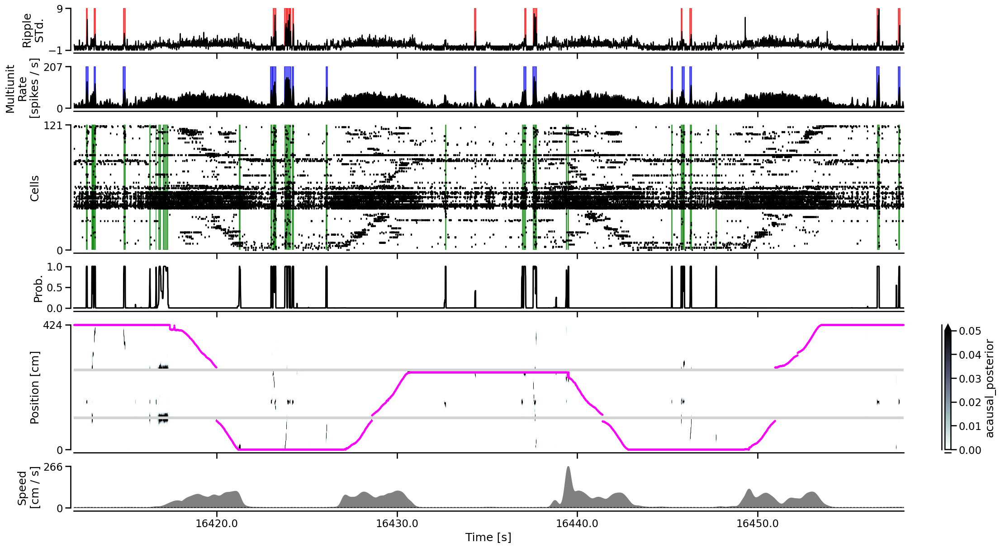

In [10]:
time_slice = slice(22_000, 45_000)
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))

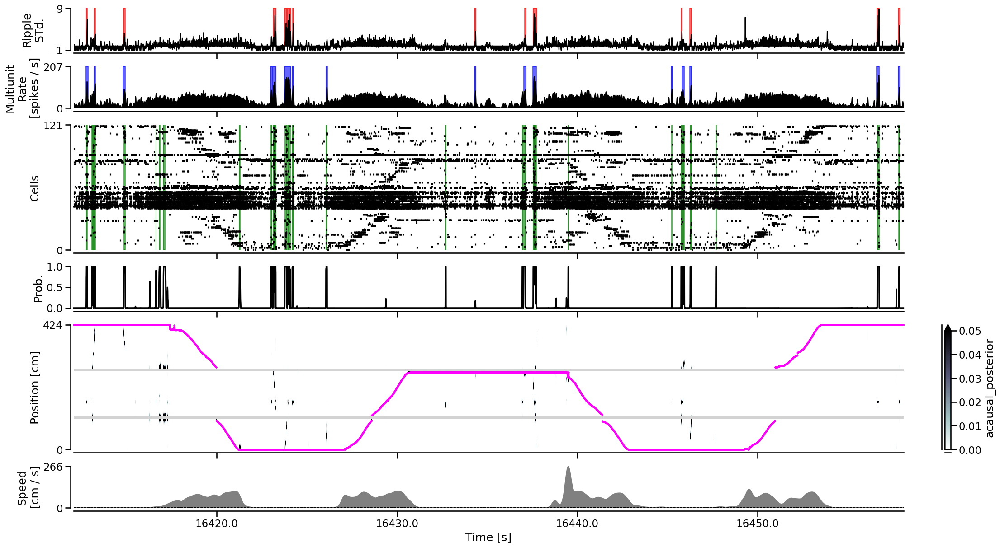

In [11]:
time_slice = slice(22_000, 45_000)
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))

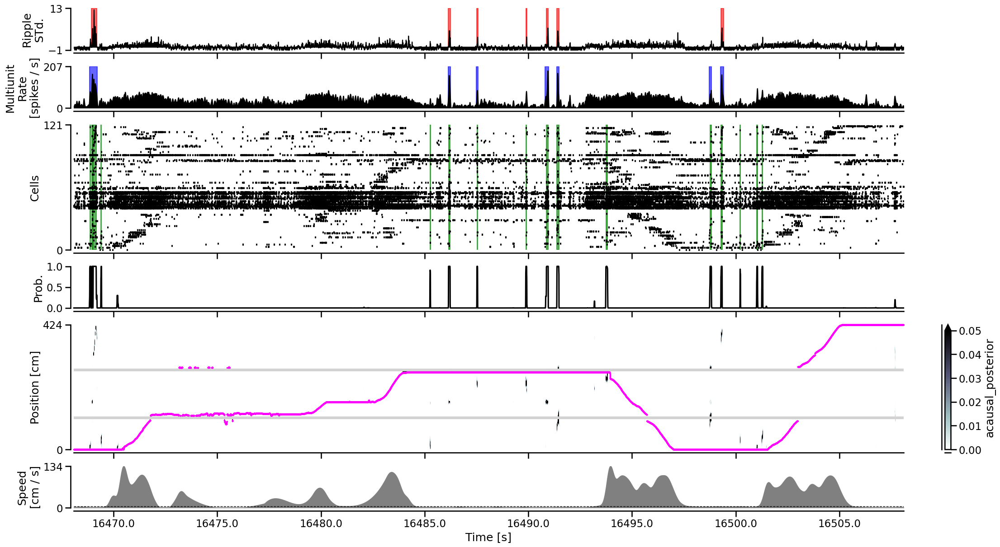

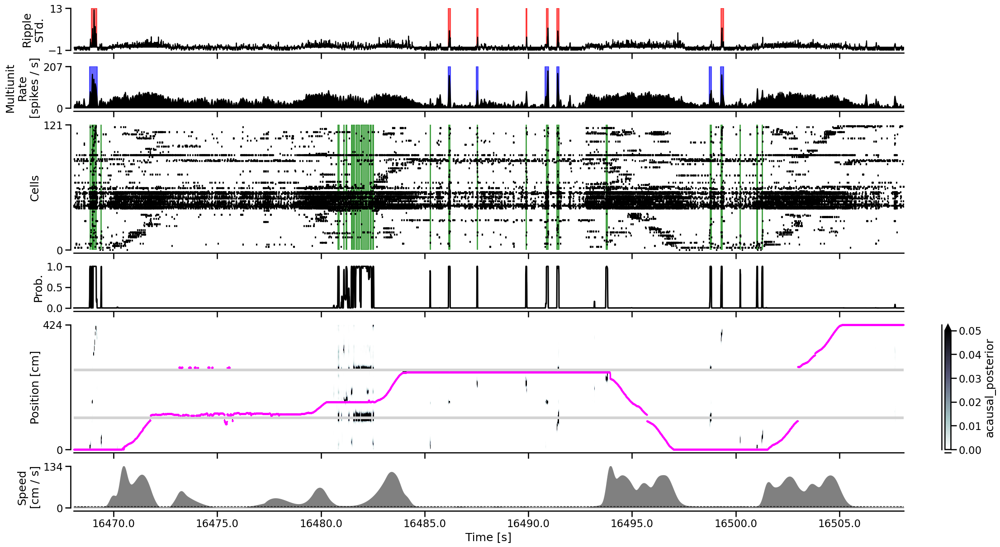

In [12]:
time_slice = slice(50_000, 70_000)
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))

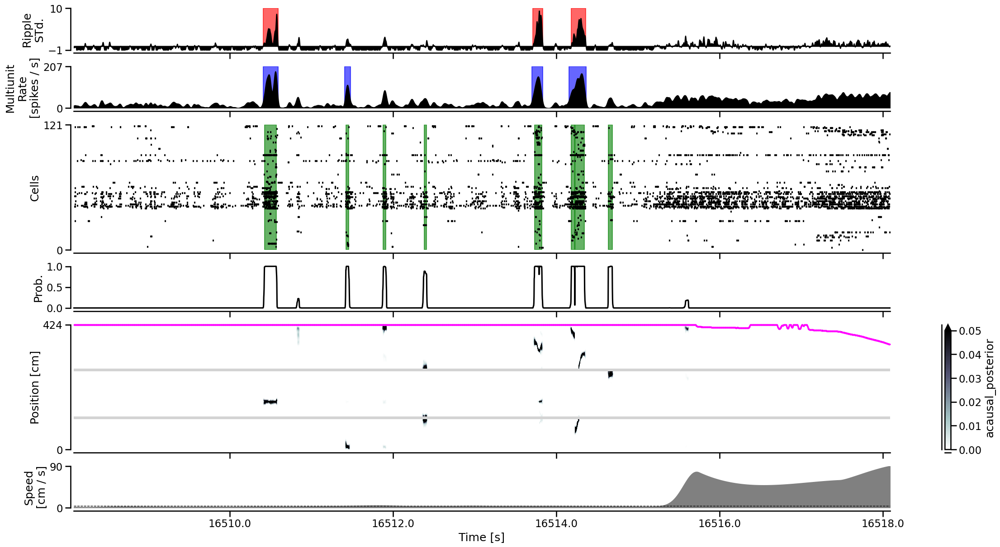

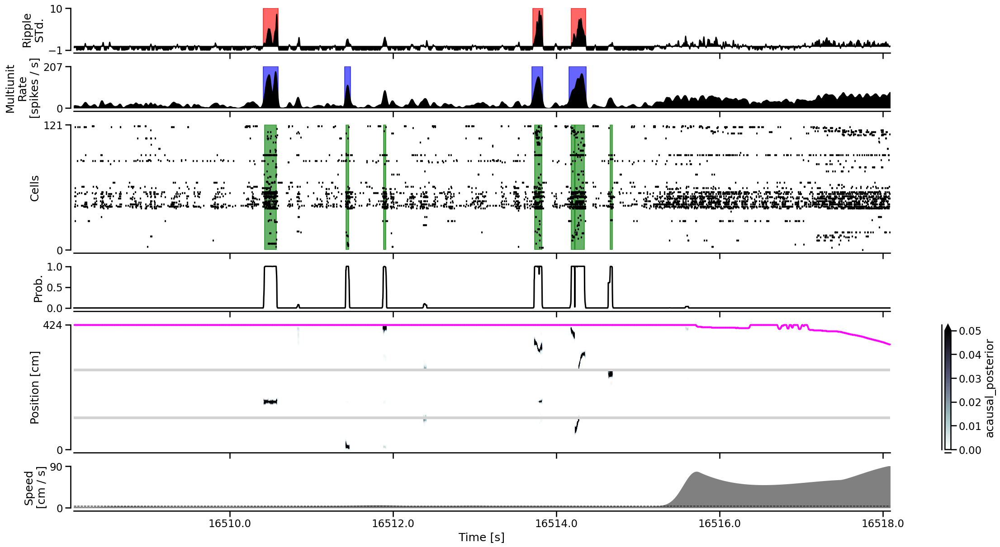

In [13]:
time_slice = slice(70_000, 75_000)
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))

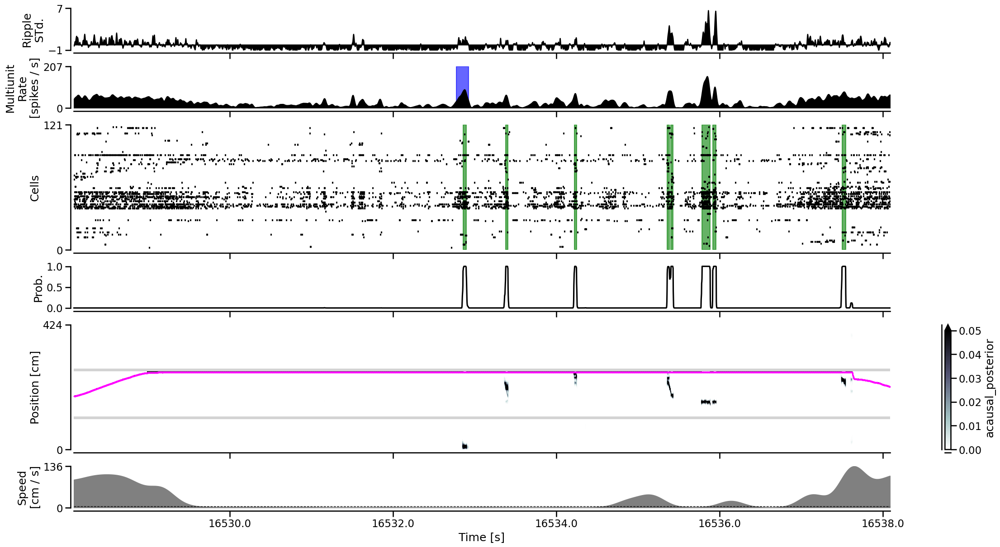

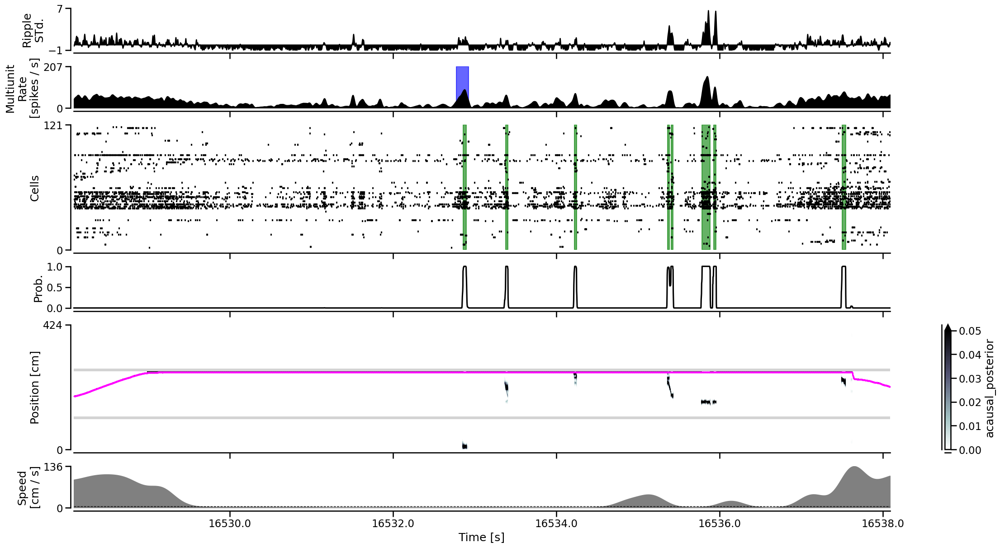

In [14]:
time_slice = slice(80_000, 85_000)
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))

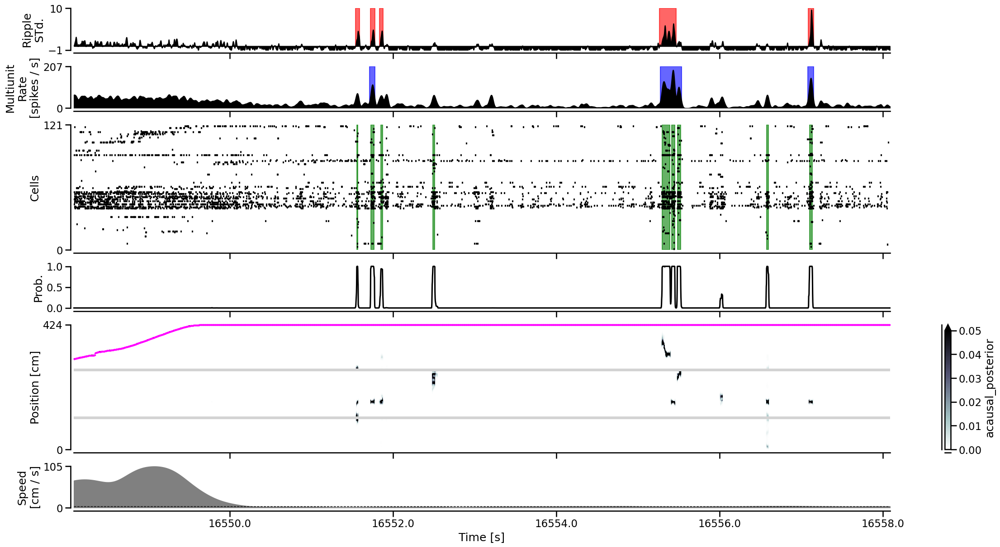

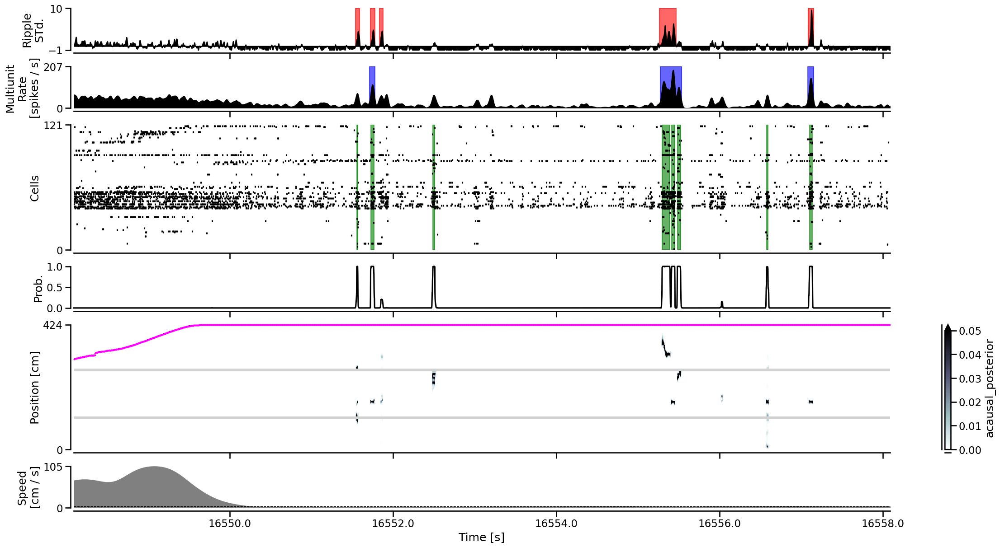

In [15]:
time_slice = slice(90_000, 95_000)
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))

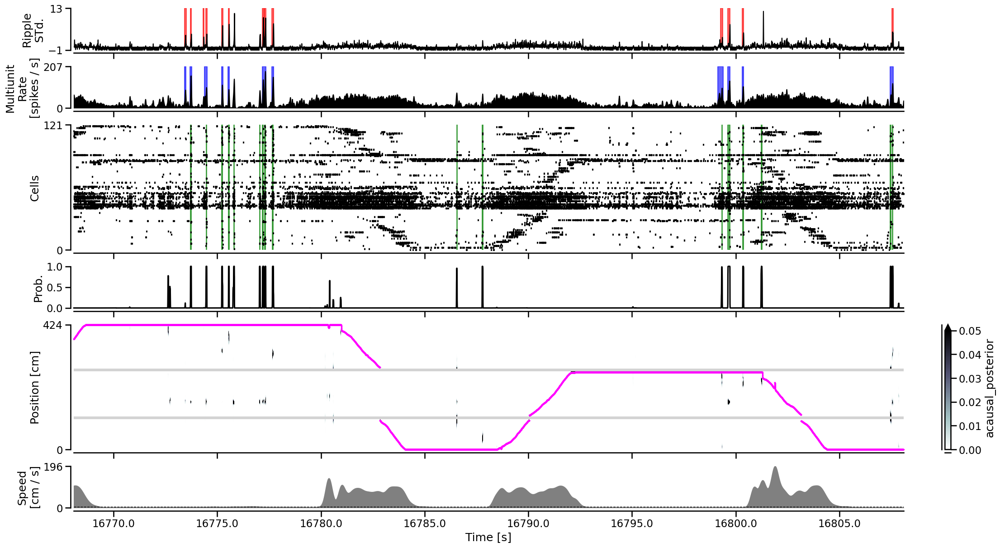

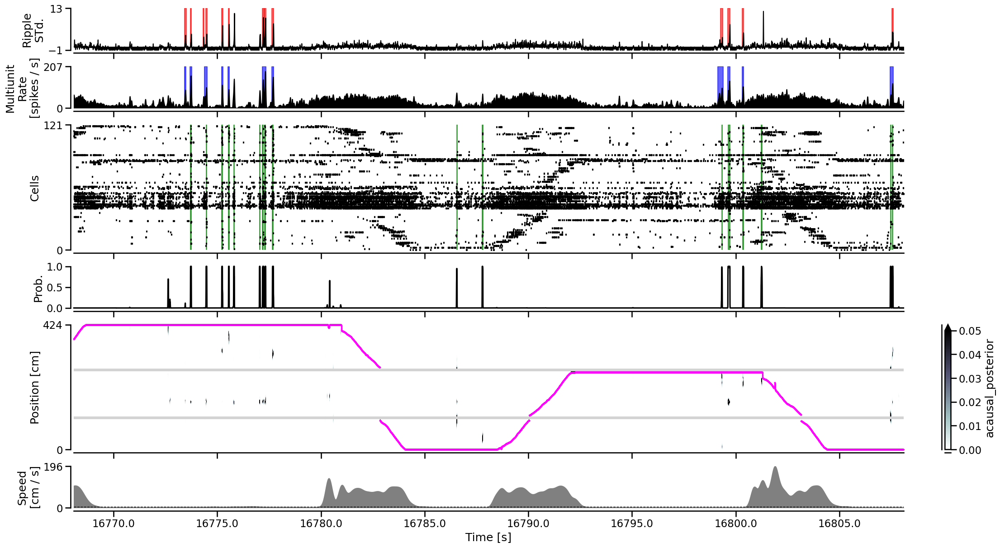

In [16]:
time_slice = slice(200_000, 220_000)
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))

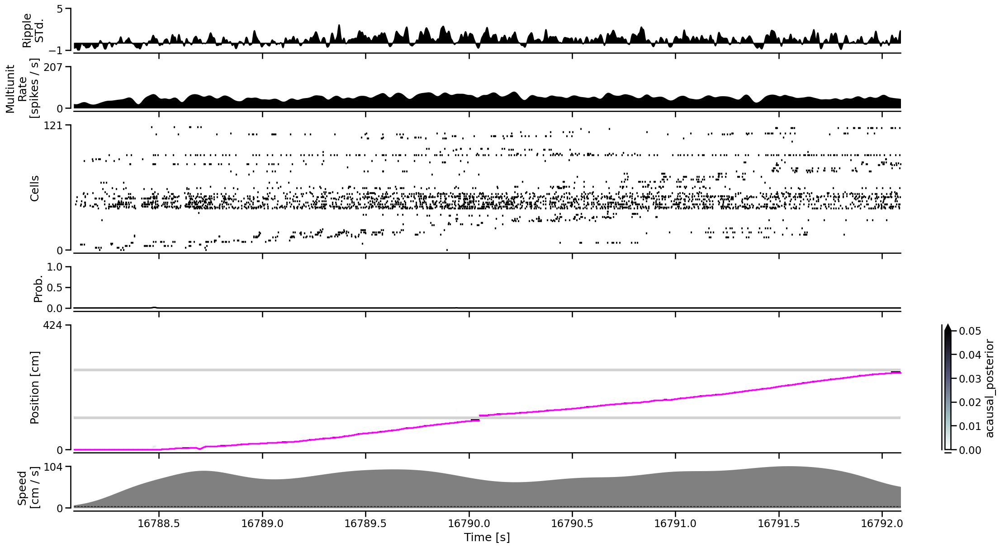

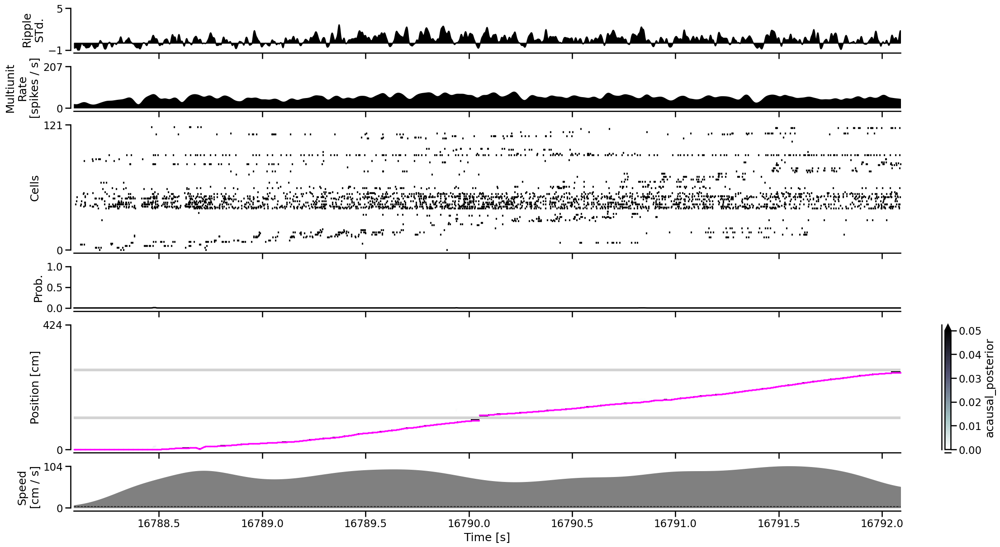

In [17]:
time_slice = slice(210_000, 212_000)
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))

In [18]:
tetrode_key = data['tetrode_info'].loc[data['tetrode_info'].suparea == 'cc'].index[0]
tetrode_key

('Jaq', 3, 12, 13)

In [19]:
from scipy.signal import filtfilt
import pandas as pd
from loren_frank_data_processing.core import reconstruct_time
from scipy.io import loadmat
import os
from src.parameters import ANIMALS


def get_gnd_tetrode_filename(tetrode_key, animals):
    '''Returns a file name for the filtered LFP for an epoch.
    Parameters
    ----------
    tetrode_key : tuple
        Unique key identifying the tetrode. Elements are
        (animal_short_name, day, epoch, tetrode_number).
    animals : dict of named-tuples
        Dictionary containing information about the directory for each
        animal. The key is the animal_short_name.
    Returns
    -------
    filename : str
        File path to tetrode file LFP
    '''
    animal, day, epoch, tetrode_number = tetrode_key
    # add eeggnd to filename to get correct theta from a reference ntrode
    filename = (f'{animals[animal].short_name}eeggnd{day:02d}'
                f'-{epoch}-{tetrode_number:02d}.mat')
    return os.path.join(animals[animal].directory, 'EEG', filename)

def _get_thetafilter_kernel():
    '''Returns the pre-computed theta filter kernel from the Frank lab.
    The kernel is 150-250 Hz bandpass with 40 db roll off and 10 Hz
    sidebands. Sampling frequency is 1500 Hz.
    '''
    filter_file = '../src/thetafilter_5_11_1500.mat'
    thetafilter = loadmat(filter_file)
    return thetafilter['thetafilter_5_11_1500']['kernel'][0][0].flatten(), 1
                                                      
def filter_theta_band(data):
    '''Returns a bandpass filtered signal between 150-250 Hz

    Parameters
    ----------
    data : array_like, shape (n_time,)

    Returns
    -------
    filtered_data : array_like, shape (n_time,)

    '''
    filter_numerator, filter_denominator = _get_thetafilter_kernel()
    is_nan = np.any(np.isnan(data), axis=-1)
    filtered_data = np.full_like(data, np.nan)
    filtered_data[~is_nan] = filtfilt(
        filter_numerator, filter_denominator, data[~is_nan], axis=0)
    return filtered_data
    
def get_gnd_LFP_dataframe(tetrode_key, animals):
    '''Gets the LFP data for a given epoch and tetrode.

    Parameters
    ----------
    tetrode_key : tuple
        Unique key identifying the tetrode. Elements are
        (animal_short_name, day, epoch, tetrode_number).
    animals : dict of named-tuples
        Dictionary containing information about the directory for each
        animal. The key is the animal_short_name.

    Returns
    -------
    LFP : pandas dataframe
        Contains the electric potential and time
    '''
    try:
        lfp_file = loadmat(get_gnd_tetrode_filename(tetrode_key, ANIMALS))
        lfp_data = lfp_file['eeggnd'][0, -1][0, -1][0, -1]
        lfp_time = reconstruct_time(
            lfp_data['starttime'][0, 0].item(),
            lfp_data['data'][0, 0].size,
            float(lfp_data['samprate'][0, 0].squeeze()))
        return pd.Series(
            data=lfp_data['data'][0, 0].squeeze().astype(float),
            index=lfp_time,
            name='{0}_{1:02d}_{2:02}_{3:03}'.format(*tetrode_key))
    except (FileNotFoundError, TypeError):
        logger.warning('Failed to load file: {0}'.format(
            get_LFP_filename(tetrode_key, animals)))
        
gnd_lfp = get_gnd_LFP_dataframe(tetrode_key, ANIMALS)
theta_filtered_lfp = filter_theta_band(gnd_lfp[:, np.newaxis])

(205000.0, 212000.0)

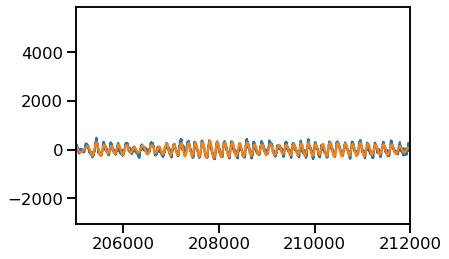

In [20]:
plt.plot(gnd_lfp.values)
plt.plot(theta_filtered_lfp)
plt.xlim((205_000, 212_000))

In [21]:
from scipy.signal import filtfilt, hilbert
from scipy.fftpack import next_fast_len

axis = 0 

is_nan = np.isnan(theta_filtered_lfp)
n_samples = theta_filtered_lfp[~is_nan].shape[axis]
phase_angle = np.full_like(theta_filtered_lfp, np.nan)
phase_angle[~is_nan] = np.angle(hilbert(theta_filtered_lfp[~is_nan], axis=axis))

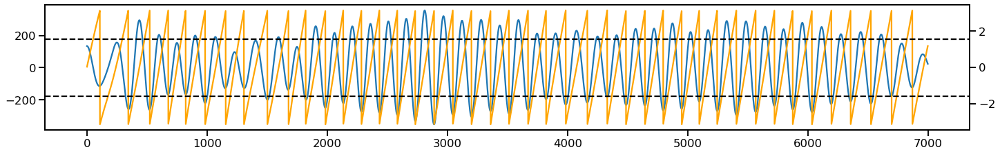

In [22]:
fig, ax = plt.subplots(1, 1, constrained_layout=True, sharex=True, figsize=(20, 3))
ax.plot(theta_filtered_lfp[slice(205_000, 212_000)])
twin_ax = ax.twinx()
twin_ax.plot(phase_angle[slice(205_000, 212_000)], color='orange')
twin_ax.axhline(np.pi / 2, color='black', linestyle='--')
twin_ax.axhline(-np.pi / 2, color='black', linestyle='--')


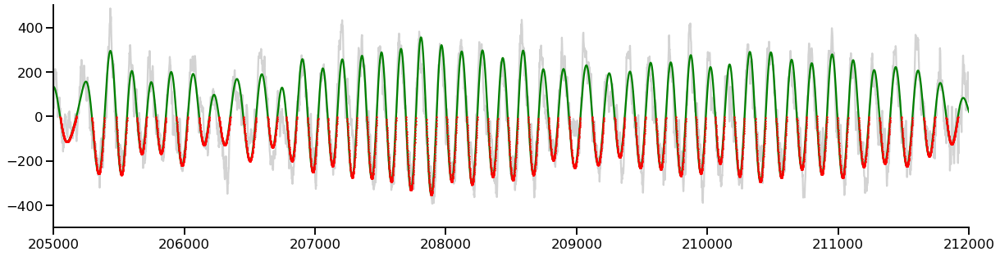

In [23]:
plt.figure(figsize=(20, 5))
is_trough = ((phase_angle > np.pi / 2) | (phase_angle < -np.pi / 2)).squeeze()

plt.plot(np.arange(theta_filtered_lfp.shape[0]), gnd_lfp.values, color='lightgrey', zorder=1)
plt.plot(np.arange(theta_filtered_lfp.shape[0]), theta_filtered_lfp, color='green', zorder=2)
plt.scatter(np.arange(theta_filtered_lfp.shape[0])[is_trough],
            theta_filtered_lfp[is_trough], s=1, zorder=3, color='red')
plt.xlim((205_000, 212_000))
plt.ylim((-500, 500))
sns.despine()

In [24]:
is_trough = pd.Series(is_trough, index=gnd_lfp.index)

In [25]:
is_trough

time
0 days 04:32:35.865700       False
0 days 04:32:35.866366666    False
0 days 04:32:35.867033333    False
0 days 04:32:35.867700       False
0 days 04:32:35.868366666    False
                             ...  
0 days 04:47:45.528366666    False
0 days 04:47:45.529033333    False
0 days 04:47:45.529699999    False
0 days 04:47:45.530366666    False
0 days 04:47:45.531033333    False
Length: 1364499, dtype: bool

In [26]:
new_index = pd.Index(
    np.unique(np.concatenate((data['position_info'].index, is_trough.index))), name="time"
)
is_trough = (
    is_trough.reindex(index=new_index)
    .interpolate(method="pad")
    .reindex(index=data['position_info'].index)
)

In [27]:
is_trough

time
0 days 04:32:48.089892304     True
0 days 04:32:48.091892304     True
0 days 04:32:48.093892304     True
0 days 04:32:48.095892304     True
0 days 04:32:48.097892304     True
                             ...  
0 days 04:47:45.505892304    False
0 days 04:47:45.507892304    False
0 days 04:47:45.509892304    False
0 days 04:47:45.511892304    False
0 days 04:47:45.513892304    False
Freq: 2L, Length: 448713, dtype: bool

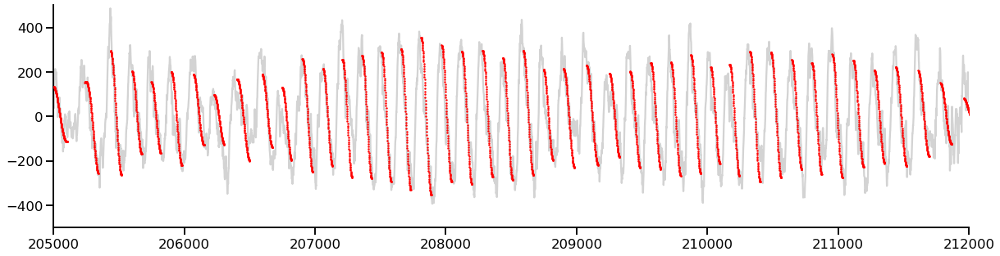

In [28]:
plt.figure(figsize=(20, 5))
is_descending = (phase_angle >= 0.0).squeeze()

plt.plot(np.arange(theta_filtered_lfp.shape[0]), gnd_lfp.values, color='lightgrey', zorder=1)
# plt.plot(np.arange(theta_filtered_lfp.shape[0]), theta_filtered_lfp, color='green', zorder=2)
plt.scatter(np.arange(theta_filtered_lfp.shape[0])[is_descending],
            theta_filtered_lfp[is_descending], s=1, zorder=3, color='red')
plt.xlim((205_000, 212_000))
plt.ylim((-500, 500))
sns.despine()

In [29]:
is_descending = pd.Series(is_descending, index=gnd_lfp.index)
new_index = pd.Index(
    np.unique(np.concatenate((data['position_info'].index, is_descending.index))), name="time"
)
is_descending = (
    is_descending.reindex(index=new_index)
    .interpolate(method="pad")
    .reindex(index=data['position_info'].index)
)

In [30]:
detector_parameters['discrete_diagonal'][1]

0.968

In [31]:
(~data['is_ripple']).mean()

replay_number    0.978175
dtype: float64

In [1]:
is_training_theta = ~((~is_descending.squeeze() & (data['position_info'].nose_vel > 4).squeeze()) | data['is_ripple'].squeeze())
is_training_theta.mean()

NameError: name 'is_descending' is not defined

In [33]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING

replay_detector_theta = ReplayDetector(**detector_parameters)
logging.info(replay_detector)

replay_detector_theta.fit(
    is_ripple=data['is_ripple'],
    is_training=is_training_theta.values.squeeze(),
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
)

detector_results_theta = replay_detector_theta.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=False)

21-Dec-21 07:16:22 ReplayDetector(discrete_diagonal=array([3.00e-05, 9.68e-01]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_var=6...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_model_knot_spacing=8.0,
               spike_model_penalty

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

21-Dec-21 07:22:11 Finding causal non-local probability and position...
21-Dec-21 07:22:25 Finding acausal non-local probability and position...


In [34]:
(is_training_theta.values[:-1] & is_training_theta.values[1:]).mean()

0.6859923514414591

In [35]:
(is_training_theta.values[:-1] & ~is_training_theta.values[1:]).mean()

0.010648255451157981

In [36]:
detector_parameters2 = {
    'movement_var': 6.0,
    'replay_speed': 1,
    'place_bin_size': 2.5,
    'spike_model_knot_spacing': 8.0,
    'spike_model_penalty': 0.5,
    'movement_state_transition_type': 'random_walk',
    'multiunit_model_kwargs': {
        'bandwidth': np.array([20.0, 20.0, 20.0, 20.0, 8.0])},
    'multiunit_occupancy_kwargs': {'bandwidth': np.array([8.0])},
    'discrete_state_transition_type': 'constant',
    'discrete_diagonal': np.asarray(
        [(is_training_theta.values[:-1] & ~is_training_theta.values[1:]).mean(),
         (is_training_theta.values[:-1] & is_training_theta.values[1:]).mean()])
}

In [37]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING

replay_detector_theta2 = ReplayDetector(**detector_parameters2)
logging.info(replay_detector_theta2)

replay_detector_theta2.fit(
    is_ripple=data['is_ripple'],
    is_training=is_training_theta.values.squeeze(),
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
)

detector_results_theta2 = replay_detector_theta2.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=False)

21-Dec-21 07:22:59 ReplayDetector(discrete_diagonal=array([0.01064826, 0.68599235]),
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_type='random_walk', movement_v...
               multiunit_model_kwargs={'bandwidth': array([20., 20., 20., 20.,  8.])},
               multiunit_occupancy_kwargs={'bandwidth': array([8.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.5, position_range=None, replay_speed=1,
               replay_state_transition_penalty=1e-05, speed_knots=None,
               speed_threshold=4.0, spike_model_knot_spacing=8.0,
               spike_model_penalty

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

21-Dec-21 07:28:47 Finding causal non-local probability and position...
21-Dec-21 07:28:56 Finding acausal non-local probability and position...


Text(0.5, 0.98, 'Descending Theta w/ state transition')

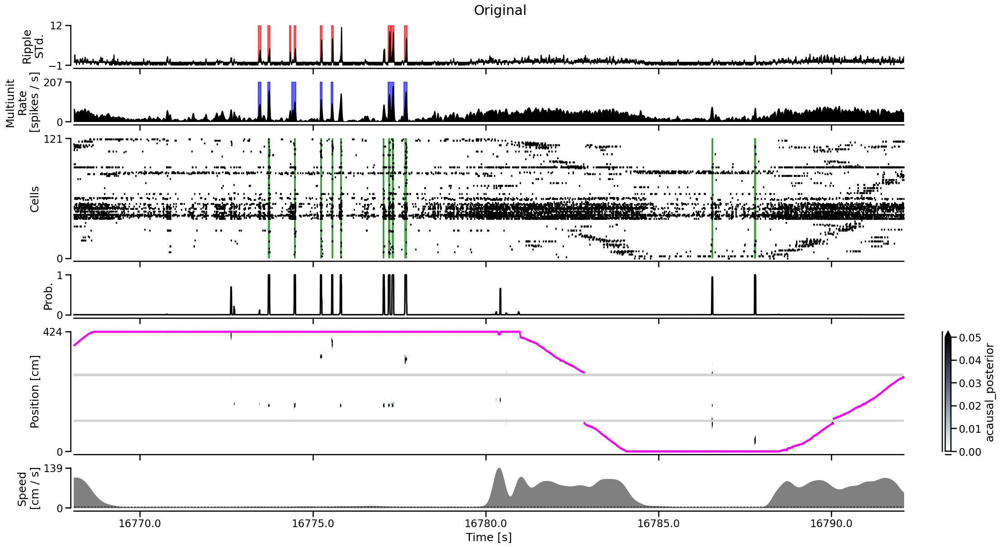

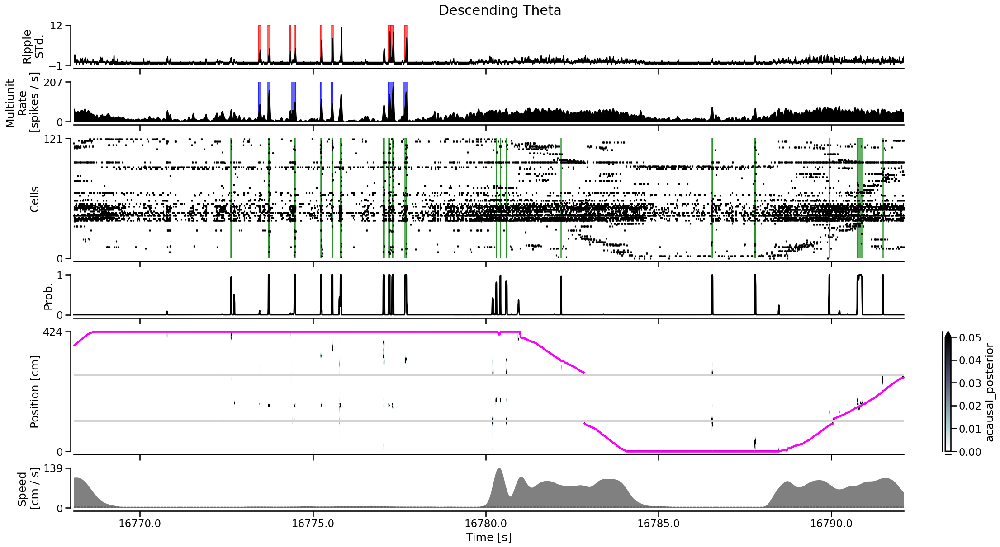

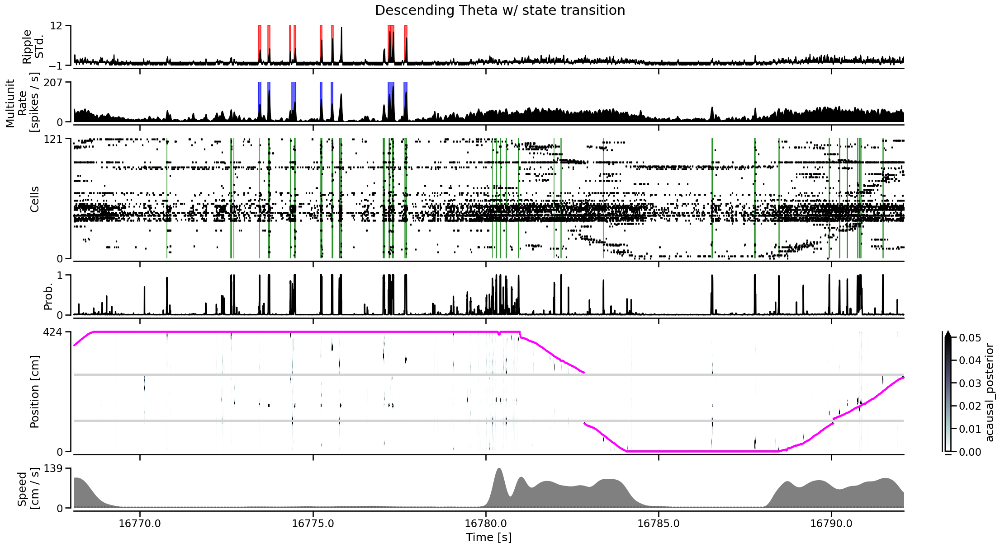

In [38]:
time_slice = slice(200_000, 212_000)
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))
plt.suptitle('Original')
plot_detector(time_slice, data, replay_detector_theta, detector_results_theta, figsize=(22, 12.0))
plt.suptitle('Descending Theta')
plot_detector(time_slice, data, replay_detector_theta2, detector_results_theta2, figsize=(22, 12.0))
plt.suptitle('Descending Theta w/ state transition')

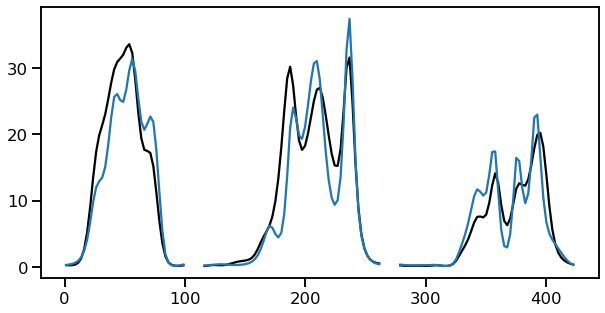

In [39]:
neuron_ind = 7

fig, ax = plt.subplots(figsize=(10, 5))

place_conditional_intensity = (
    replay_detector._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
place_conditional_intensity[~replay_detector.is_track_interior_] = np.nan
ax.plot(replay_detector.place_bin_centers_, place_conditional_intensity[:, neuron_ind] * 500,
        color='black', zorder=10)

place_conditional_intensity = (
    replay_detector_theta._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
place_conditional_intensity[~replay_detector_theta.is_track_interior_] = np.nan
ax.plot(replay_detector_theta.place_bin_centers_, place_conditional_intensity[:, neuron_ind] * 500,
        zorder=10)

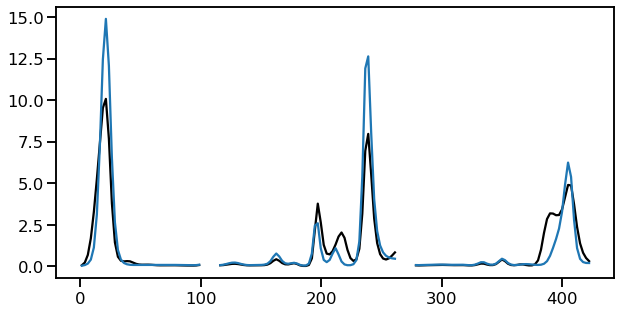

In [40]:
neuron_ind = 11

fig, ax = plt.subplots(figsize=(10, 5))

place_conditional_intensity = (
    replay_detector._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
place_conditional_intensity[~replay_detector.is_track_interior_] = np.nan
ax.plot(replay_detector.place_bin_centers_, place_conditional_intensity[:, neuron_ind] * 500,
        color='black', zorder=10)

place_conditional_intensity = (
    replay_detector_theta._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
place_conditional_intensity[~replay_detector_theta.is_track_interior_] = np.nan
ax.plot(replay_detector_theta.place_bin_centers_, place_conditional_intensity[:, neuron_ind] * 500,
        zorder=10)

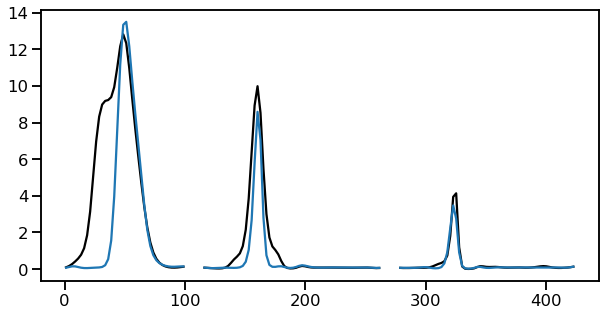

In [41]:
neuron_ind = 13

fig, ax = plt.subplots(figsize=(10, 5))

place_conditional_intensity = (
    replay_detector._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
place_conditional_intensity[~replay_detector.is_track_interior_] = np.nan
ax.plot(replay_detector.place_bin_centers_, place_conditional_intensity[:, neuron_ind] * 500,
        color='black', zorder=10)

place_conditional_intensity = (
    replay_detector_theta._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze().copy()
place_conditional_intensity[~replay_detector_theta.is_track_interior_] = np.nan
ax.plot(replay_detector_theta.place_bin_centers_, place_conditional_intensity[:, neuron_ind] * 500,
        zorder=10)

Text(0.5, 0.98, 'Descending Theta w/ state transition')

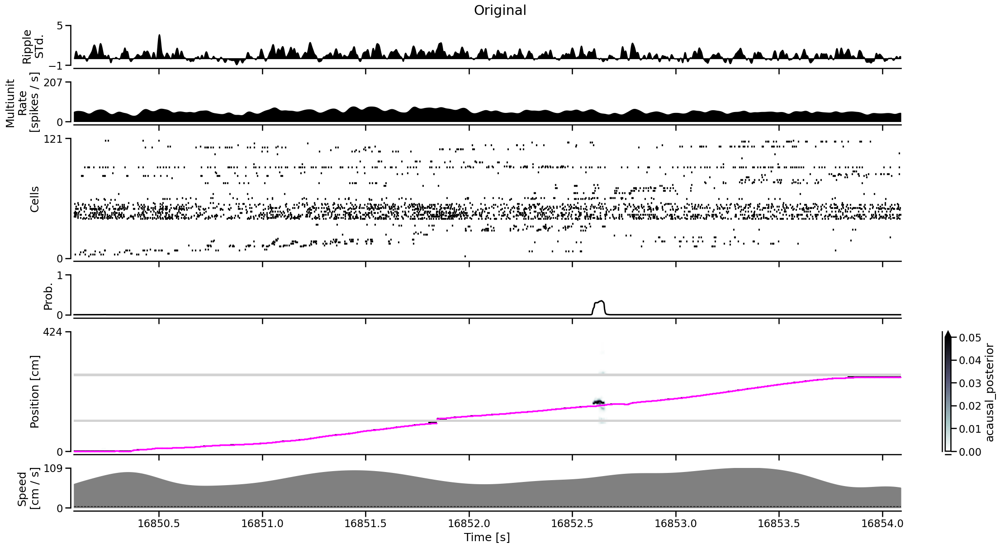

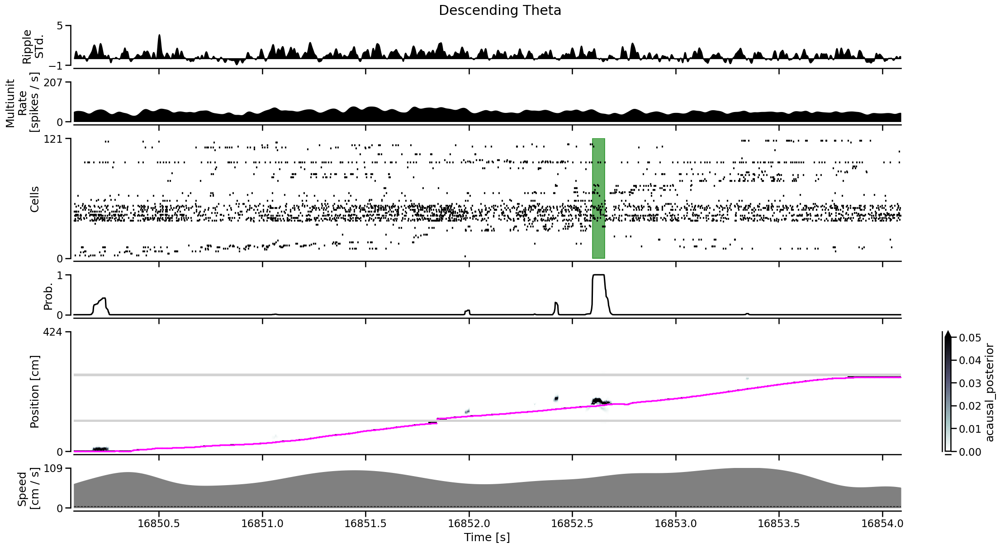

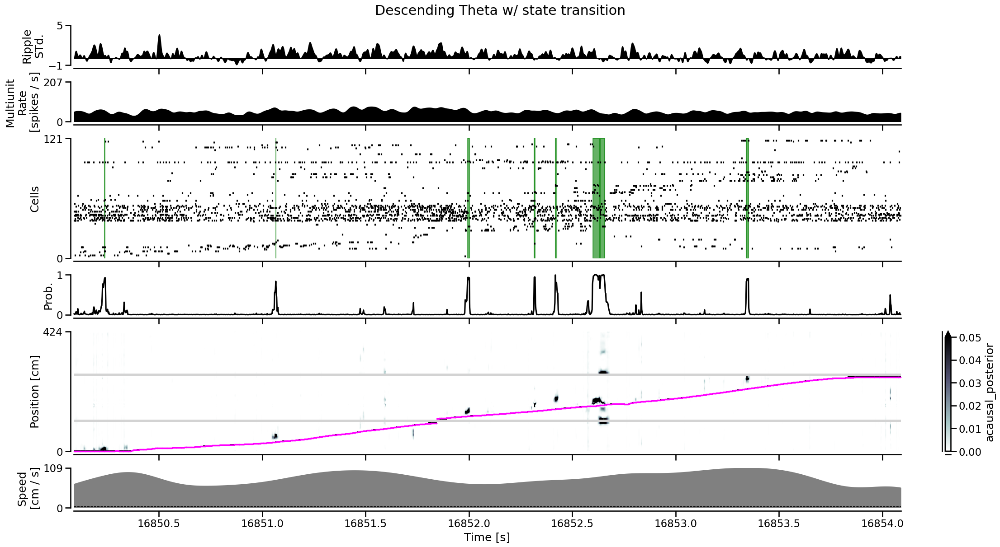

In [42]:
time_slice = slice(241_000, 243_000)
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))
plt.suptitle('Original')
plot_detector(time_slice, data, replay_detector_theta, detector_results_theta, figsize=(22, 12.0))
plt.suptitle('Descending Theta')
plot_detector(time_slice, data, replay_detector_theta2, detector_results_theta2, figsize=(22, 12.0))
plt.suptitle('Descending Theta w/ state transition')

Text(0.5, 0.98, 'Descending Theta w/ state transition')

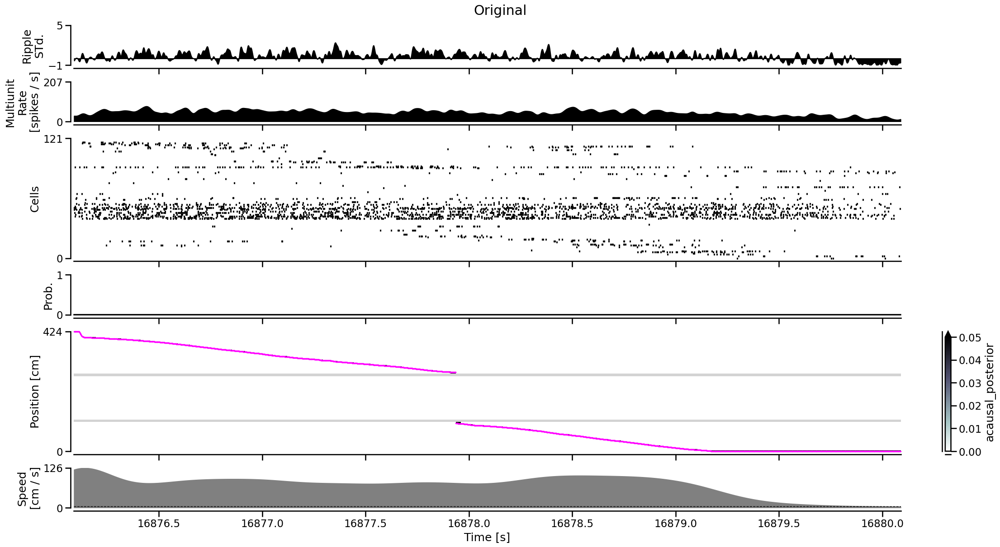

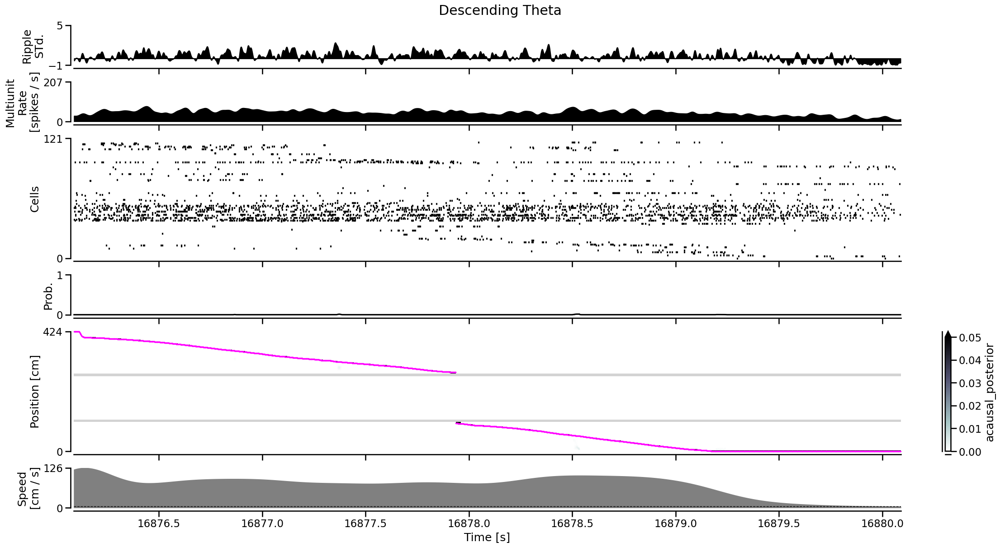

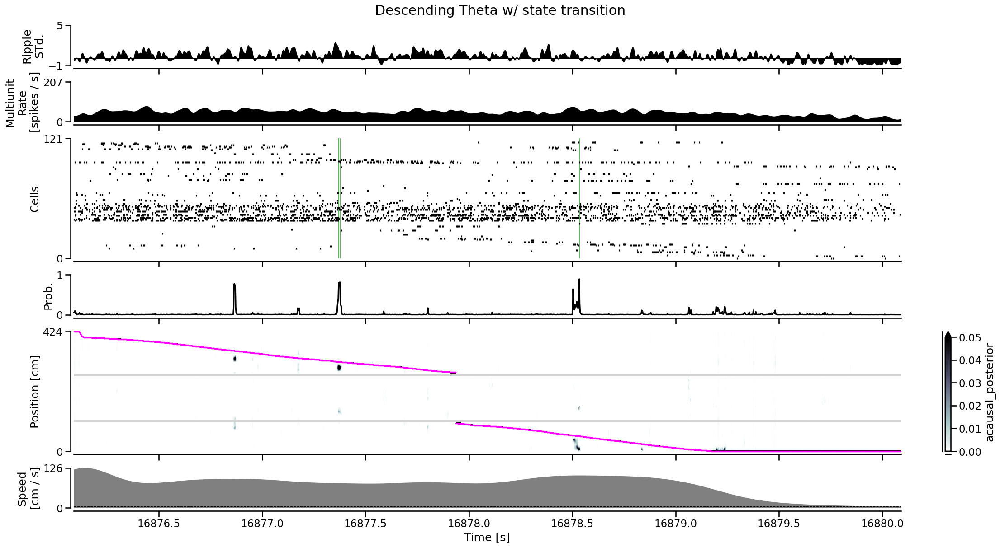

In [43]:
time_slice = slice(254_000, 256_000)
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))
plt.suptitle('Original')
plot_detector(time_slice, data, replay_detector_theta, detector_results_theta, figsize=(22, 12.0))
plt.suptitle('Descending Theta')
plot_detector(time_slice, data, replay_detector_theta2, detector_results_theta2, figsize=(22, 12.0))
plt.suptitle('Descending Theta w/ state transition')

Text(0.5, 0.98, 'Descending Theta w/ state transition')

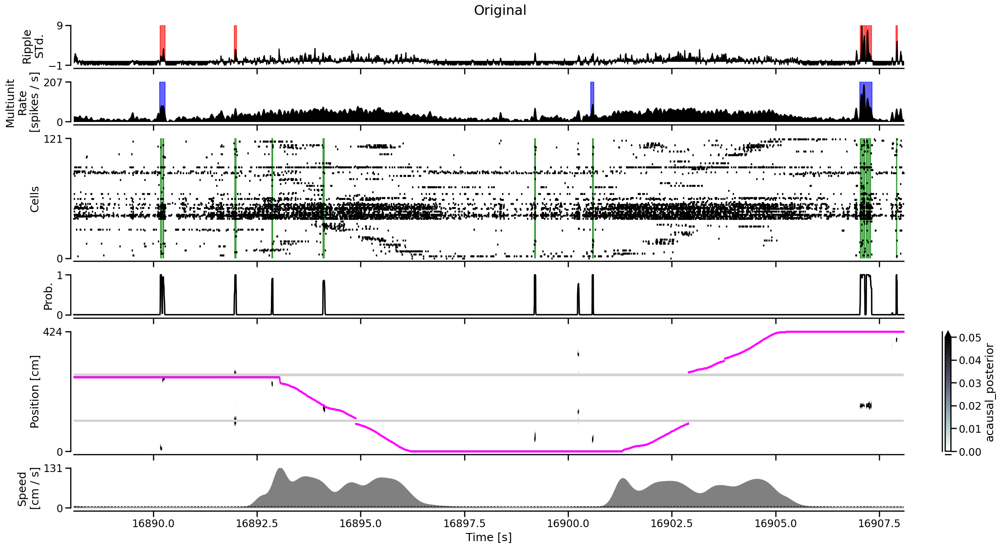

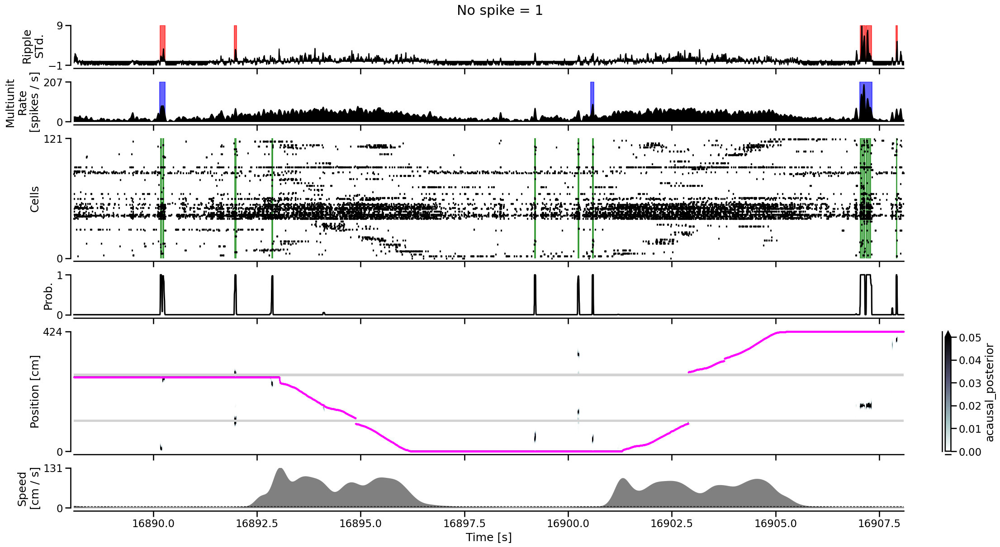

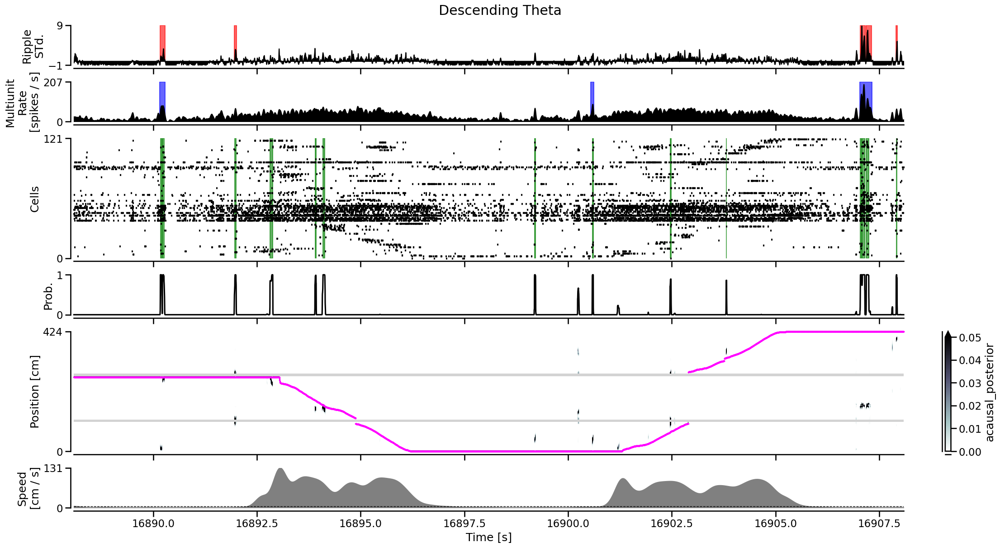

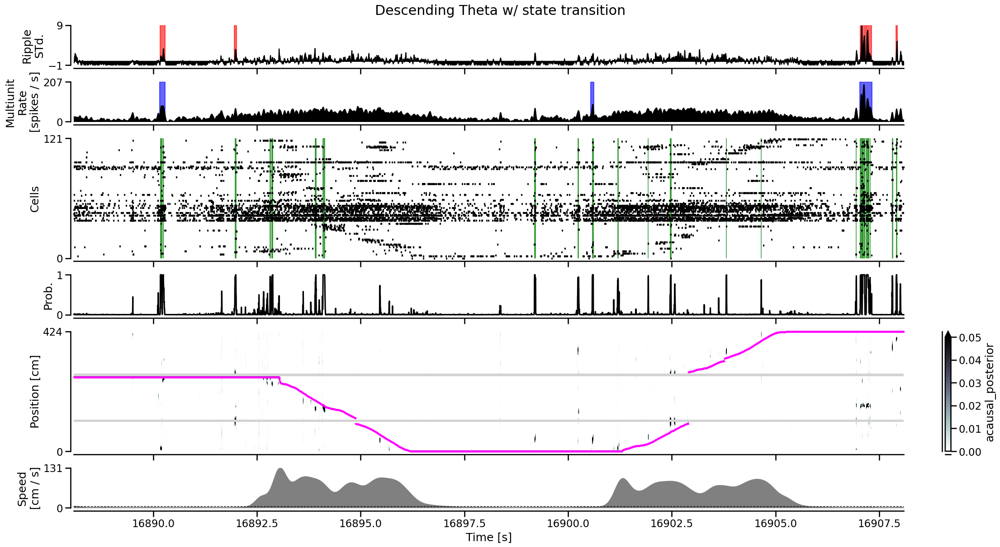

In [44]:
time_slice = slice(260_000, 270_000)
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))
plt.suptitle('Original')
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plt.suptitle('No spike = 1')
plot_detector(time_slice, data, replay_detector_theta, detector_results_theta, figsize=(22, 12.0))
plt.suptitle('Descending Theta')
plot_detector(time_slice, data, replay_detector_theta2, detector_results_theta2, figsize=(22, 12.0))
plt.suptitle('Descending Theta w/ state transition')

Text(0.5, 0.98, 'Descending Theta w/ state transition')

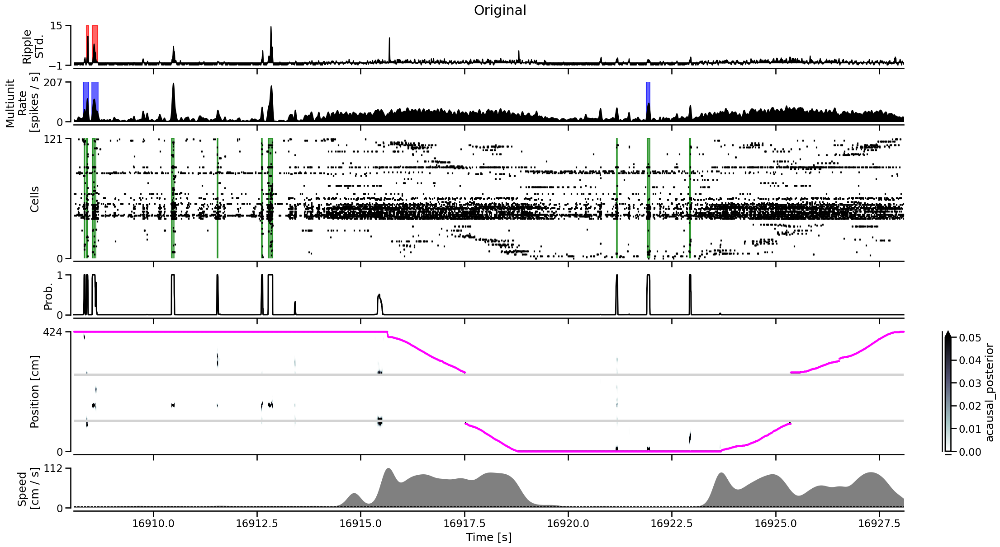

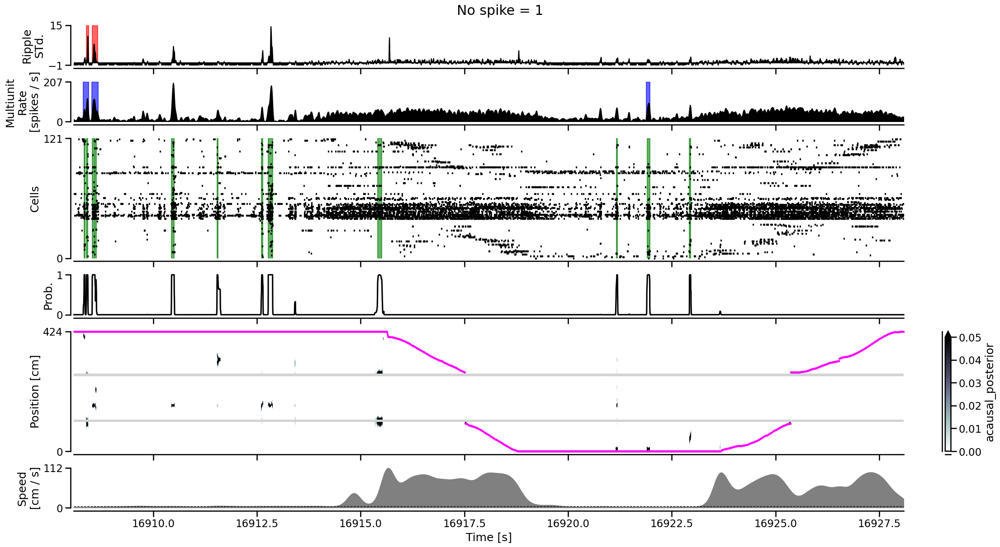

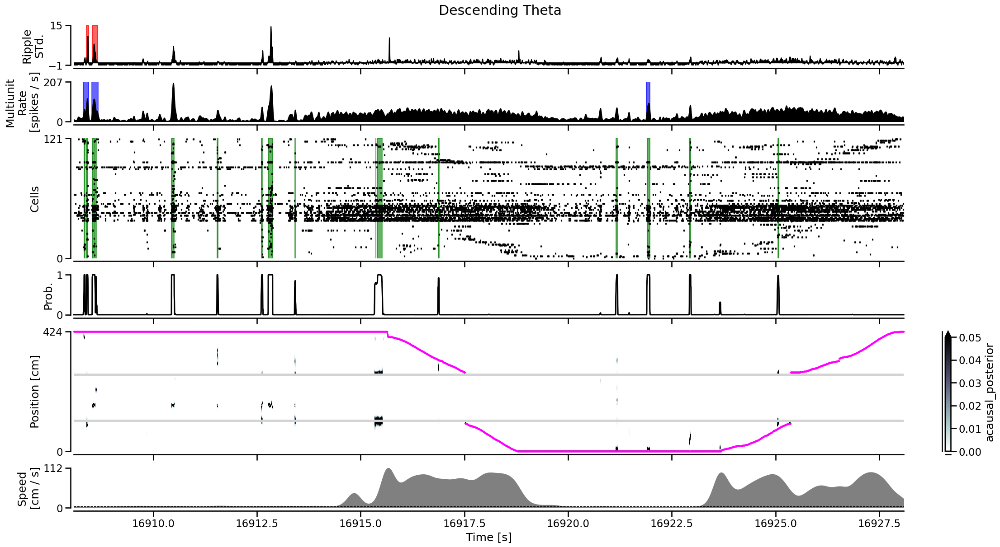

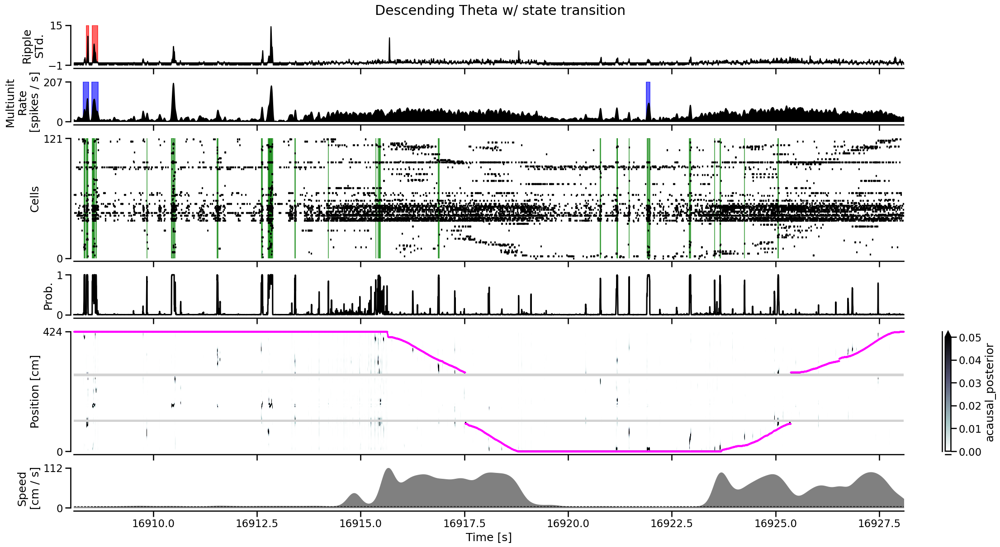

In [45]:
time_slice = slice(270_000, 280_000)
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))
plt.suptitle('Original')
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plt.suptitle('No spike = 1')
plot_detector(time_slice, data, replay_detector_theta, detector_results_theta, figsize=(22, 12.0))
plt.suptitle('Descending Theta')
plot_detector(time_slice, data, replay_detector_theta2, detector_results_theta2, figsize=(22, 12.0))
plt.suptitle('Descending Theta w/ state transition')

Text(0.5, 0.98, 'Descending Theta w/ state transition')

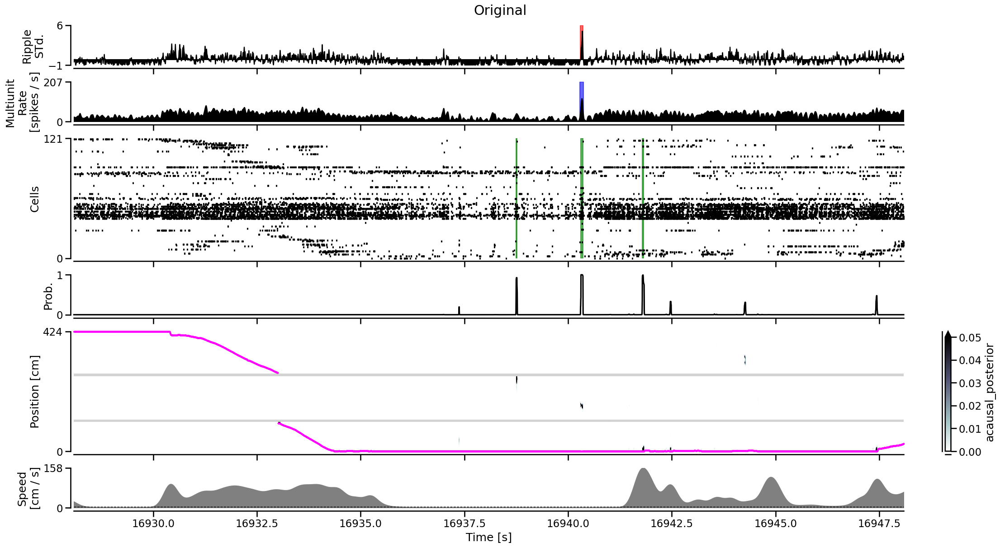

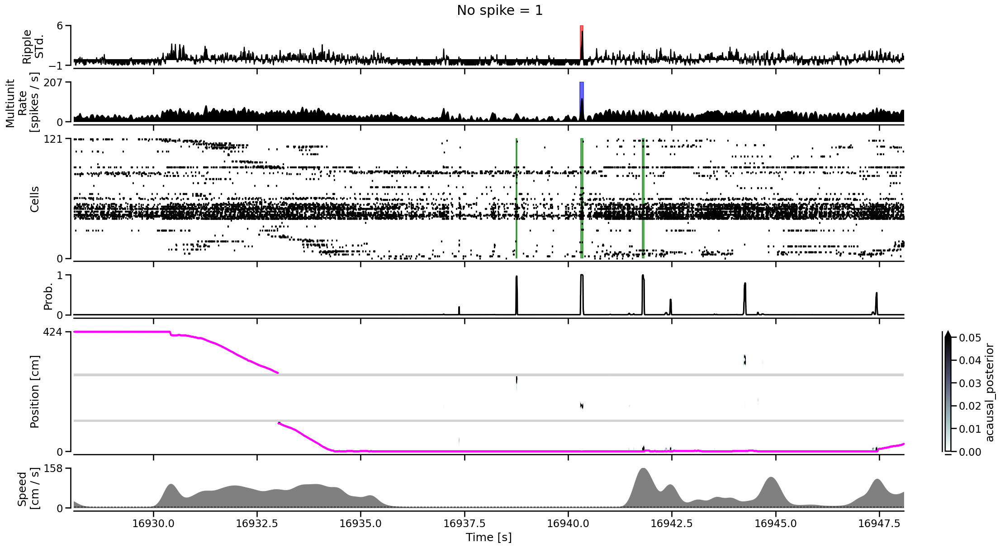

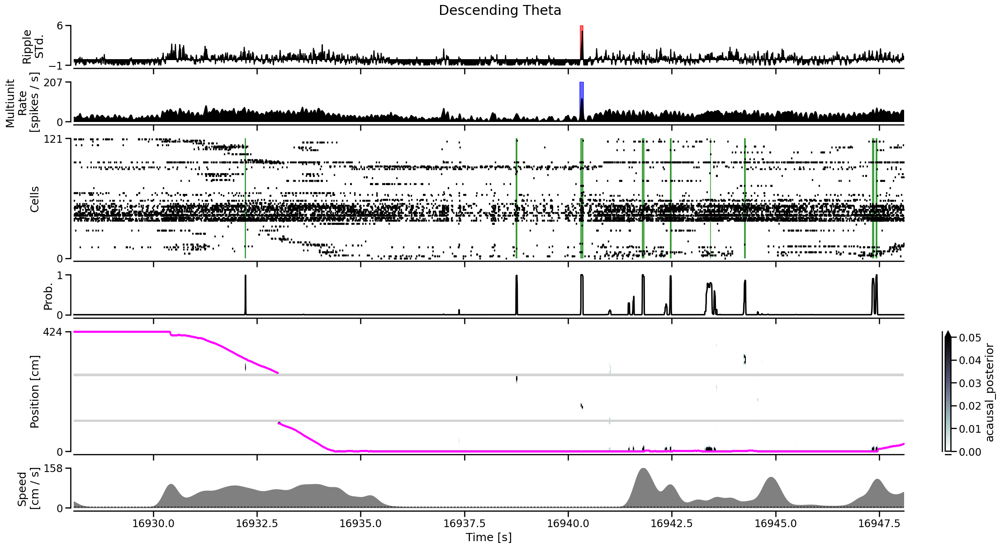

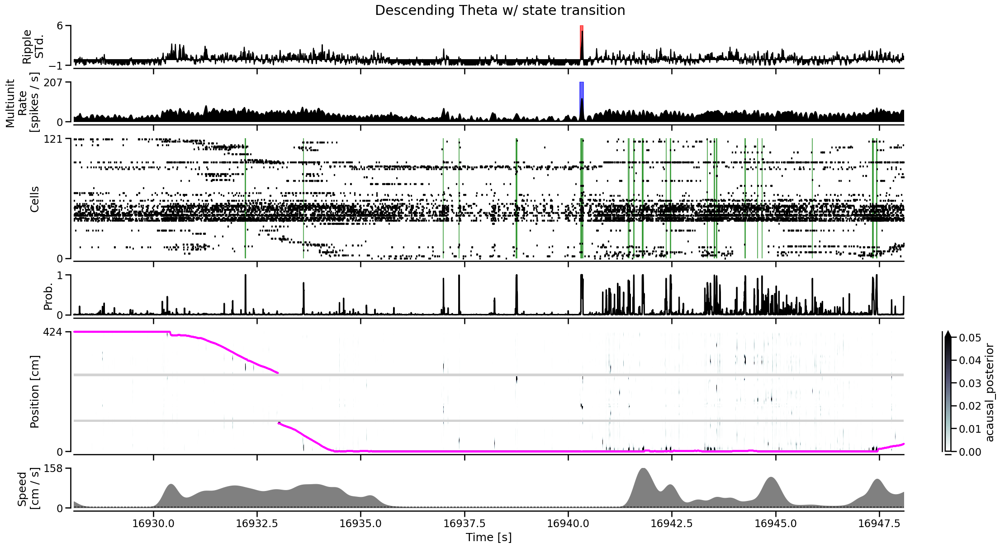

In [46]:
time_slice = slice(280_000, 290_000)
plot_detector(time_slice, data, replay_detector, detector_results2, figsize=(22, 12.0))
plt.suptitle('Original')
plot_detector(time_slice, data, replay_detector, detector_results, figsize=(22, 12.0))
plt.suptitle('No spike = 1')
plot_detector(time_slice, data, replay_detector_theta, detector_results_theta, figsize=(22, 12.0))
plt.suptitle('Descending Theta')
plot_detector(time_slice, data, replay_detector_theta2, detector_results_theta2, figsize=(22, 12.0))
plt.suptitle('Descending Theta w/ state transition')

In [ ]:
X1 = {'type': 'linearized_position', 'times': times_numpy_array, 'positions': positions_numpy_array}
X2 = {'type': 'linearized_position_pdf', ...}
X3 = {'type': 'raster_plot', ...}
X4 = {'type': 'firing_rate', ...}
data_to_be_pickled = [X1, X2, X3, X4, ...]

In [48]:
data.keys()

dict_keys(['position_info', 'tetrode_info', 'neuron_info', 'spikes', 'dio', 'dio_indicator', 'track_graph', 'edge_order', 'edge_spacing', 'ripple_times', 'ripple_labels', 'ripple_filtered_lfps', 'ripple_consensus_trace', 'ripple_lfps', 'ripple_consensus_trace_zscore', 'instantaneous_ripple_power_change', 'is_ripple', 'multiunits', 'multiunit_spikes', 'multiunit_firing_rate', 'multiunit_high_synchrony_times', 'multiunit_high_synchrony_labels', 'multiunit_rate_change', 'multiunit_rate_zscore', 'is_multiunit_high_synchrony'])

In [ ]:
    axes[4].scatter(data['position_info'].iloc[time_ind].index /
                    np.timedelta64(1, 's'),
                    data['position_info'].iloc[time_ind].linear_position,
                    s=1,
                    color='magenta', clip_on=False)

In [81]:
ripple_consensus_trace = zscore(data['ripple_consensus_trace'], nan_policy='omit')
ripple_consensus_trace_time = np.asarray(ripple_consensus_trace.index / np.timedelta64(1, 's'))

ripple_zscore = {
    'type': 'zscore_ripple_consensus_trace',
    'time': ripple_consensus_trace_time,
    'data': np.asarray(ripple_consensus_trace).squeeze(),
    'units': 'std',
}

multiunit_firing = (
    data["multiunit_firing_rate"]
    .reset_index(drop=True)
    .set_index(
        data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
)

multiunit_rate = {
    'type': 'multiunit_firing_rate',
    'time': multiunit_firing.index.values,
    'data': np.asarray(multiunit_firing).squeeze(),
    'units': 'spikes / s',
}

place_fields = (
    replay_detector._spiking_likelihood
    .keywords['place_conditional_intensity']).squeeze()
place_field_max = np.nanargmax(place_fields, axis=0)
linear_position_order = place_field_max.argsort(axis=0).squeeze()

spike_time_ind, neuron_ind = np.nonzero(
    np.asarray(data['spikes'])[:, linear_position_order])
time = data['spikes'].index / np.timedelta64(1, 's')

spike_data = {
    'type': 'spikes',
    'spike_times': np.asarray(time[spike_time_ind]),
    'cell_id': neuron_ind,
}

linear_position = {
    'type': 'linear_position',
    'time': np.asarray(data['position_info'].index / np.timedelta64(1, 's')),
    'data': np.asarray(data['position_info'].linear_position).squeeze(),
    'units': 'cm',
}
speed = {
    'type': 'speed',
    'time': np.asarray(data['position_info'].index / np.timedelta64(1, 's')),
    'data': np.asarray(data['position_info'].nose_vel).squeeze(),
    'units': 'cm / s',
}

probabilities = {
    'type': 'decoded_state_probability',
    'time': np.asarray(detector_results.time),
    'state_names': np.asarray(detector_results.state),
    'data': detector_results.acausal_posterior.sum('position').values,
    'units': 'probability'
}


posterior = (detector_results
 .acausal_posterior
 .sum('state')
 .where(replay_detector.is_track_interior_))

posterior = {
    'type': 'decoded_position_probability',
    'time': np.asarray(detector_results.time),
    'data': np.asarray(posterior),
    'units': 'probability'
}


pickled_data = [ripple_zscore, multiunit_rate, spike_data,
                linear_position, speed, probabilities, posterior]
np.save('Jaq_03_12_visualization_data.npy', pickled_data)

In [82]:
pickled_data

[{'type': 'zscore_ripple_consensus_trace',
  'time': array([16355.8657    , 16355.86636667, 16355.86703333, ...,
         17265.5297    , 17265.53036667, 17265.53103333]),
  'data': array([ 0.39759907,  0.56605246,  0.70891177, ..., -0.77222012,
         -0.90524138, -1.04444182]),
  'units': 'std'},
 {'type': 'multiunit_firing_rate',
  'time': array([16368.0898923, 16368.0918923, 16368.0938923, ..., 17265.5098923,
         17265.5118923, 17265.5138923]),
  'data': array([32.64194918, 34.66170244, 36.45821816, ..., 24.6715746 ,
         21.84752399, 19.11163241]),
  'units': 'spikes / s'},
 {'type': 'spikes',
  'spike_times': array([16368.0898923, 16368.0898923, 16368.0898923, ..., 17265.5118923,
         17265.5118923, 17265.5118923]),
  'cell_id': array([  2,   3,   4, ...,  60,  87, 118])},
 {'type': 'linear_position',
  'time': array([16368.0898923, 16368.0918923, 16368.0938923, ..., 17265.5098923,
         17265.5118923, 17265.5138923]),
  'data': array([161.44725772, 161.44725772